# LIBRARIES & SETTINGS

In [123]:
# import os
# import sys
import math
import time
import yaml
# import errno
# import random
import datetime
import numpy as np
import pandas as pd
from tqdm import trange
from tqdm.notebook import tqdm

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error

import torch
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
from torch.utils.data import Dataset, TensorDataset, DataLoader

import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [124]:
# set random seed
fix_seed = 1111
np.random.seed(fix_seed)
torch.manual_seed(fix_seed)

# set device
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')
print(device)

mps


In [125]:
# path
root_path = '/Users/koki/PycharmProjects/MasterThesis/'

# file names
data_file = 'data/preprocessed/201601to202309_10areas_for_analysis.csv'
param_file = 'params/config_lstm_seq2seq.yml'
result_file = 'data/results_serena.xlsx'

# DATA AND PARAMETERS

## Import Data

In [126]:
# import data
df = pd.read_csv(root_path + data_file)
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.set_index('datetime')

## Define Parameters

In [127]:
# load parameters
with open(root_path + param_file, 'r') as yml:
    yaml_data = yaml.safe_load(yml)

In [128]:
# all parameters
time_list = yaml_data['dataset']['time_list']
train_start = yaml_data['dataset']['train_start']
train_end = yaml_data['dataset']['train_end']
valid_start = yaml_data['dataset']['valid_start']
valid_end = yaml_data['dataset']['valid_end']
test_start = yaml_data['dataset']['test_start']
test_end = yaml_data['dataset']['test_end']

seq_len_src = yaml_data['dataset']['seq_len_src']
seq_len_tgt = yaml_data['dataset']['seq_len_tgt']
lag_len = yaml_data['dataset']['lag_len']
batch_size = yaml_data['dataset']['batch_size']

hidden_size = yaml_data['model']['hidden_size']
num_layers = yaml_data['model']['num_layers']
dropout = yaml_data['model']['dropout']

num_features_pred = yaml_data['training']['num_features_pred']
n_epochs = yaml_data['training']['n_epochs']
learning_rate = yaml_data['training']['learning_rate']
milestones = yaml_data['training']['milestones']
gamma = yaml_data['training']['gamma']

# standardize option
standardize_data = True
ss = StandardScaler()

In [129]:
# check parameters
display(yaml_data)

{'dataset': {'time_list': 'all',
  'train_start': '2016-01-01',
  'train_end': '2021-12-31',
  'valid_start': '2022-01-01',
  'valid_end': '2022-12-31',
  'test_start': '2023-01-01',
  'test_end': '2023-09-30',
  'seq_len_src': 56,
  'seq_len_tgt': 8,
  'lag_len': 8,
  'batch_size': 8},
 'model': {'hidden_size': 128, 'num_layers': 4, 'dropout': 0.2},
 'training': {'n_epochs': 20,
  'learning_rate': 1e-05,
  'milestones': [10],
  'gamma': 0.5,
  'num_features_pred': 10}}

# PREPROCESS DATA

In [130]:
# first covid dummy
covid_1 = pd.date_range(start='2020-03-01', end='2020-05-30 21:00', freq='3h')  # 第1波
df['first_covid'] = df.index.map(lambda d: int(d in covid_1))

# covid_2 = pd.date_range(start='2020-11-01', end='2021-04-30 21:00', freq='3h')  # 第3波, 第4波
# covid_3 = pd.date_range(start='2021-07-01', end='2021-09-30 21:00', freq='3h')  # 第5波
# covid_4 = pd.date_range(start='2021-12-01', end='2022-03-31 21:00', freq='3h')  # 第6波(オミクロン株の拡大)
# covid = covid_2.union(covid_3).union(covid_4)
# df['covid'] = df.index.map(lambda d: int(d in covid))

In [131]:
# covid dummy
# before_covid = pd.date_range(start='2016-01-01', end='2020-01-25 21:00', freq='3h')
# df['before_covid'] = df.index.map(lambda d: int(d in covid_1))

# during_covid = pd.date_range(start='2020-01-26', end='2022-05-31 21:00', freq='3h')
# df['during_covid'] = df.index.map(lambda d: int(d in covid_1))

# after_covid = pd.date_range(start='2022-06-01', end='2023-09-30 21:00', freq='3h')
# df['after_covid'] = df.index.map(lambda d: int(d in covid_1))

In [132]:
# create cumulative covid cases column
df['cumulative_cases'] = df['Cases_Tokyo'].cumsum()

## Reorganize Columns

In [133]:
# separate dummy and non-dummy column names
dummy_col_list = [df.columns[i] for i in range(df.shape[1]) if len(df.iloc[:, i].value_counts()) == 2]
nondummy_col_list = [col_name for col_name in df.columns if col_name not in dummy_col_list]

num_dummy = len(dummy_col_list)

In [134]:
# reorganize df
df = pd.concat([df[nondummy_col_list], df[dummy_col_list]], axis=1)

## Select Features

In [135]:
df.columns

Index(['渋谷駅_total', '新宿駅_total', '町田駅_total', '川崎駅_total', '立川駅_total',
       '八王子駅_total', '北千住駅_total', '東京駅_total', '赤羽駅_total', '自由が丘駅_total',
       '東京_rainfall', '東京_temperature', '東京_dew_point_humidity', '東京_humidity',
       '東京_windspeed_value', '東京_sunshine_hours', '東京_global_solar_radiation',
       '東京_snowfall', '八王子_rainfall', '八王子_temperature', '八王子_windspeed_value',
       '八王子_sunshine_hours', 'N225_Close', 'Cases_Tokyo', 'cumulative_cases',
       'official_holiday', 'unofficial_holiday', 'month_1', 'month_10',
       'month_11', 'month_12', 'month_2', 'month_3', 'month_4', 'month_5',
       'month_6', 'month_7', 'month_8', 'month_9', 'hour_0', 'hour_12',
       'hour_15', 'hour_18', 'hour_21', 'hour_3', 'hour_6', 'hour_9',
       'dow_Fri', 'dow_Mon', 'dow_Sat', 'dow_Sun', 'dow_Thu', 'dow_Tue',
       'dow_Wed', 'heavy_rain', '東京_weather_みぞれ', '東京_weather_快晴',
       '東京_weather_晴れ', '東京_weather_曇', '東京_weather_氷あられ', '東京_weather_薄曇',
       '東京_weather_雨', '東京_wea

In [136]:
df = df.drop(columns=[
       # non dummy
       'Cases_Tokyo', 
       # 'cumulative_cases', 
       'N225_Close',
       '東京_rainfall', '東京_temperature', '東京_dew_point_humidity', '東京_humidity',
       '東京_windspeed_value', '東京_sunshine_hours', '東京_global_solar_radiation',
       # '東京_snowfall', 
       '八王子_rainfall', '八王子_temperature', '八王子_windspeed_value', '八王子_sunshine_hours',
       
       # dummy
       # 'official_holiday', 'unofficial_holiday', 
       'month_1', 'month_10', 'month_11', 'month_12', 'month_2', 'month_3',
       'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9',
       'hour_0', 'hour_12', 'hour_15', 'hour_18', 'hour_21', 'hour_3', 'hour_6', 'hour_9',
       'dow_Fri', 'dow_Mon', 'dow_Sat', 'dow_Sun', 'dow_Thu', 'dow_Tue', 'dow_Wed', 
       '東京_weather_みぞれ', '東京_weather_快晴', '東京_weather_晴れ', '東京_weather_曇',
       '東京_weather_氷あられ', '東京_weather_薄曇', '東京_weather_雨', 
       '東京_weather_雪',
       '東京_weather_雷電', '東京_緊急事態', '東京_まん防', '東京_weather_霧雨', 
       # 'heavy_rain',
       'first_covid', 
       ])

In [137]:
df.columns

Index(['渋谷駅_total', '新宿駅_total', '町田駅_total', '川崎駅_total', '立川駅_total',
       '八王子駅_total', '北千住駅_total', '東京駅_total', '赤羽駅_total', '自由が丘駅_total',
       '東京_snowfall', 'cumulative_cases', 'official_holiday',
       'unofficial_holiday', 'heavy_rain'],
      dtype='object')

In [138]:
# check plot
check = 0
if check:
    # plot with plotly
    for i in range(10):
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=df.index, y=df.iloc[:, i], name=df.columns[i]))

        fig.update_xaxes(title="Date",showgrid=False)
        fig.update_yaxes(title="Population", showgrid=False)
        fig.update_layout(legend=dict(x=0.99,
                                  y=0.99,
                                  xanchor='right',
                                  yanchor='top',
                                  orientation='h',
                                  ),
                          hovermode='x unified',
                          title=dict(text=df.columns[i][:-6],
                                    font=dict(size=20, color='grey'),
                                    xref='paper', # container or paper
                                    x=0.5,
                                    y=0.85,
                                    xanchor='center'
                                    )
                        )
        fig.show()

## Split Data

In [139]:
# split data helper function
def split_data(df, standardize_data=False):
    # split df into train, valid and test data
    df_train = df.loc[train_start:train_end].copy()
    df_valid = df.loc[valid_start:valid_end].copy()
    df_test = df.loc[test_start:test_end].copy()

    # choose hours to use
    if time_list != 'all':
        df_valid = df_valid.loc[df_valid.index.hour.isin(time_list)]
        df_test = df_test.loc[df_test.index.hour.isin(time_list)]

    # standardize df
    if standardize_data:
        num_nondummy_cols = len([df.columns[i] for i in range(df.shape[1]) if len(df.iloc[:, i].value_counts()) != 2])

        ss.fit(df_train.iloc[:, :num_nondummy_cols])

        df_train_tmp = pd.DataFrame(ss.transform(df_train.iloc[:, :num_nondummy_cols]), columns=df_train.columns[:num_nondummy_cols], index=df_train.index)
        df_valid_tmp = pd.DataFrame(ss.transform(df_valid.iloc[:, :num_nondummy_cols]), columns=df_valid.columns[:num_nondummy_cols], index=df_valid.index)
        df_test_tmp = pd.DataFrame(ss.transform(df_test.iloc[:, :num_nondummy_cols]), columns=df_test.columns[:num_nondummy_cols], index=df_test.index)

        # reset dummy columns
        df_train = pd.concat([df_train_tmp, df_train.iloc[:, num_nondummy_cols:]], axis=1)
        df_valid = pd.concat([df_valid_tmp, df_valid.iloc[:, num_nondummy_cols:]], axis=1)
        df_test = pd.concat([df_test_tmp, df_test.iloc[:, num_nondummy_cols:]], axis=1)

    # print the fraction of each dataset
    print("Train set fraction: {:.3f}%".format(len(df_train)/len(df)*100))
    print("Valid set fraction: {:.3f}%".format(len(df_valid)/len(df)*100))
    print("Test set fraction: {:.3f}%".format(len(df_test)/len(df)*100))

    return df_train, df_valid, df_test

In [140]:
df_train, df_valid, df_test = split_data(df, standardize_data=standardize_data)

# df for prediction
df_valid_for_pred = pd.concat([df_train.iloc[-seq_len_src:, :], df_valid])  # valid_dataの1期目から予測するために、前日もテストデータに含める。
df_test_for_pred = pd.concat([df_valid.iloc[-seq_len_src:, :], df_test])  # test_dataの1期目から予測するために、前日もテストデータに含める。

Train set fraction: 77.456%
Valid set fraction: 12.898%
Test set fraction: 9.647%


## Define Dataset

In [141]:
class SequenceDataset(Dataset):
    def __init__(self, dataframe, seq_len_src=56, seq_len_tgt=8, lag_len=1):
        self.seq_len_src = seq_len_src
        self.lag_len = lag_len
        self.seq_len_tgt = seq_len_tgt
        self.df = torch.tensor(dataframe.values).float()
        self.len = math.floor((len(self.df) - self.seq_len_src - self.seq_len_tgt) / self.lag_len) + 1

    def __len__(self):
        return self.len

    def __getitem__(self, i):
        if type(i) == slice:
            raise Exception('Exception: Expected int, inputted slice!')

        X = self.df[i*self.lag_len:i*self.lag_len+self.seq_len_src]
        Y = self.df[i*self.lag_len+self.seq_len_src:i*self.lag_len+self.seq_len_src+self.seq_len_tgt]

        return X, Y

    def input_size(self):
        return self.df.shape[1]

## Set Dataloader

In [142]:
# create dataset
train_dataset = SequenceDataset(df_train, seq_len_src=56, seq_len_tgt=8, lag_len=1)
valid_dataset = SequenceDataset(df_valid, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)
test_dataset = SequenceDataset(df_test, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)

# dataset for prediction
valid_dataset_for_pred = SequenceDataset(df_valid_for_pred, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)
test_dataset_for_pred = SequenceDataset(df_test_for_pred, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)

print("Length of each dataset:")
print("    Train:{}, Valid:{}, Test:{}".format(len(train_dataset), len(valid_dataset), len(test_dataset)))

# create dataloader
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=False, num_workers=0, pin_memory=True)
# valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=0, pin_memory=True)
# test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=0, pin_memory=True)

# check the shape of a batch
X, y = next(iter(train_loader))
print("Features shape:", X.shape)  # [batch size, sequence length, number of features]
print("Target shape:", y.shape)

Length of each dataset:
    Train:17473, Valid:358, Test:266
Features shape: torch.Size([8, 56, 15])
Target shape: torch.Size([8, 8, 15])


# MODEL

## Define Model – **LSTM seq2seq**

In [143]:
class lstm_seq2seq(nn.Module):
    '''
    train LSTM encoder-decoder and make predictions
    モデル1：全変数をLSTMに入力し、二層の線型結合層に通して予測値を出力
    '''

    def __init__(self, num_features, hidden_size, num_layers, dropout, batch_size, num_features_pred):

        '''
        : param input_size:     the number of expected features in the input X
        : param hidden_size:    the number of features in the hidden state h
        '''

        super(lstm_seq2seq, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.batch_size= batch_size
        self.num_features_pred = num_features_pred

        # define LSTM layer
        self.encoder_lstm = nn.LSTM(input_size = 32, hidden_size = hidden_size, num_layers = num_layers, batch_first=True, dropout = dropout)
        self.decoder_lstm = nn.LSTM(input_size = num_features, hidden_size = hidden_size, num_layers = num_layers, batch_first=True, dropout = dropout)
        # define fc layer for encoder
        self.linear = nn.Linear(num_features, 64)
        self.linear2 = nn.Linear(64, 32)
        # define fc layer for decoder
        self.linear3 = nn.Linear(hidden_size, 512)
        self.linear4 = nn.Linear(512, num_features_pred)
        # define relu
        self.relu = nn.ReLU()
        # define dropout
        self.dropout = nn.Dropout(0.2)

    def encoder(self, src):
        '''
        : param src:                   input of shape (batch_size, seq_len, input_size)
        : return lstm_out, hidden:     lstm_out gives all the hidden states in the sequence;
        :                              hidden gives the hidden state and cell state for the last
        :                              element in the sequence
        '''
        h0 = None
        # lstm_out, (h,c) = self.lstm(src, h0)
        output = self.linear(src)
        output = self.relu(output)
        # output = self.dropout(output)
        output = self.linear2(output)
        lstm_out, (h,c) = self.encoder_lstm(output, h0)

        return (h, c)

    def decoder(self, src, encoder_hidden_states):
        '''
        : param src:                        should be 3D (batch_size, seq_len, input_size)
        : param encoder_hidden_states:      hidden states; tuple
        : return output, hidden:            output gives all the hidden states in the sequence;
        :                                   hidden gives the hidden state and cell state for the last
        :                                   element in the sequence; tuple
        '''

        lstm_out, (h, c) = self.decoder_lstm(src, encoder_hidden_states)
        output = self.linear3(lstm_out)
        output = self.relu(output)
        # output = self.dropout(output)
        output = self.linear4(output)

        return output, (h, c)

    def forward(self, src, tgt):
        '''
        : param src:    input tensor with shape (batch_size, seq_len,  number features); PyTorch tensor
        : param tgt:    target tensor with shape (batch_size, seq_len, number features); PyTorch tensor
        '''

        encoder_hidden = self.encoder(src)  # only encoder_hidden is used
        decoder_output, decoder_hidden = self.decoder(tgt, encoder_hidden)  # decoder_output.shape = [batch_size, seq_len, num_features]

        return decoder_output

In [144]:
def train(model, data_loader, num_features_pred):
    total_loss = []
    for n_batches, (src, tgt) in enumerate(data_loader):
        src = src.to(device)
        tgt = tgt.to(device)

        # target for decoder
        input_tgt = torch.cat((src[:,-1:,:], tgt[:, :-1, :]), dim=1)

        # zero the gradient
        optimizer.zero_grad()

        output = model(src=src, tgt=input_tgt)

        # compute the loss
        loss = criterion(output[:,:,0:num_features_pred], tgt[:,:,0:num_features_pred])

        total_loss.append(loss.cpu().detach())

        # backpropagation
        loss.backward()
        optimizer.step()

    # change learning rate
    scheduler.step()

    # return loss for epoch
    return np.average(total_loss)


def predict(model, dataset, num_features_pred):
    model.eval()
    with torch.no_grad():
        all_outputs = torch.Tensor().to(device)
        for i in tqdm(range(len(dataset))):
            src = dataset[i][0].to(device)
            tgt = dataset[i][1].to(device)

            src = src.unsqueeze(0)
            tgt = tgt.unsqueeze(0)

            encoder_hidden = model.encoder(src)

            # initialize tensor for predictions
            outputs = torch.Tensor().to(device)

            # input for decoder
            decoder_input = src[:, -1:, :]
            decoder_hidden = encoder_hidden

            # predict recursively
            for t in range(tgt.shape[1]):
                decoder_output, decoder_hidden = model.decoder(decoder_input, decoder_hidden)  # decoder_output.shape = [batch_size, 1(seq_len), num_features]
                outputs = torch.cat((outputs, decoder_output[:, -1, :]), dim=0)

                # decoder input at the next period = (location output from prediction) + (acurate dummy input from test data)
                decoder_input = torch.cat((decoder_output[:, :, 0:num_features_pred], tgt[:, t:t+1, num_features_pred:]), dim=2)

            all_outputs = torch.cat([all_outputs, outputs], dim=0)

    return all_outputs[:, :num_features_pred].to('cpu').detach().numpy()

## Train

In [145]:
# define model
model = lstm_seq2seq(num_features = df.shape[1],
                     hidden_size = hidden_size,
                     num_layers = num_layers,
                     dropout = dropout,
                     batch_size=batch_size,
                     num_features_pred=num_features_pred).to(device)

optimizer = optim.Adam(model.parameters(), lr=learning_rate)
scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=milestones, gamma=gamma)
criterion = nn.MSELoss().to(device)

In [146]:
start = time.time()
train_losses = []
with trange(n_epochs) as tr:
    for it in tr:
        # train
        loss_train = train(model=model, data_loader=train_loader, num_features_pred=num_features_pred)
        # convert to RMSE if needed
        if not standardize_data:
            loss_train = math.sqrt(loss_train)
        # append epoch loss
        train_losses.append(loss_train)
        # progress bar
        tr.set_postfix(Train_loss="{0:.3f}".format(loss_train))

# calculate execution time
end = time.time()
t = math.floor(end-start)
elapsed_hour = t // 3600
elapsed_minute = (t % 3600) // 60
elapsed_second = (t % 3600 % 60)
elapsed_time = str(elapsed_hour).zfill(2) + ":" + str(elapsed_minute).zfill(2) + ":" + str(elapsed_second).zfill(2)

100%|██████████| 20/20 [23:55<00:00, 71.76s/it, Train_loss=0.025]


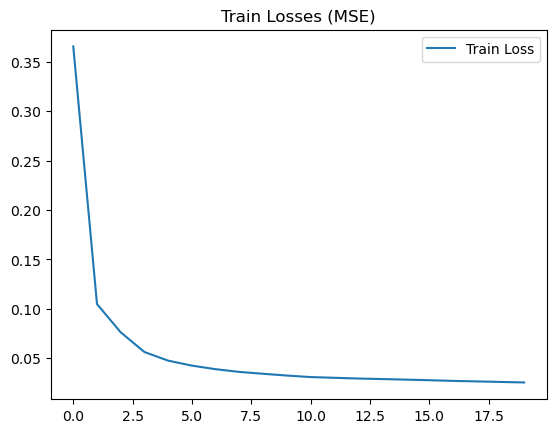

In [147]:
plt.plot(train_losses, label='Train Loss')
if standardize_data:
    plt.title('Train Losses (MSE)')
else:
    plt.title('Train Losses (RMSE)')
plt.legend()
plt.show()

## Predict

In [148]:
# undo standardize
def invTransform(data, num_features_pred):
    num_nondummy_cols = len([df.columns[i] for i in range(df.shape[1]) if len(df.iloc[:, i].value_counts()) != 2])

    dummy = pd.DataFrame(np.zeros((len(data), num_nondummy_cols - num_features_pred)), index=data.index)
    _df = pd.concat([data, dummy], axis=1)
    output = pd.DataFrame(ss.inverse_transform(_df), columns=df.columns[:num_nondummy_cols], index=data.index)

    return output.iloc[:, :num_features_pred]

In [149]:
# y_true df
y_true_df = df.loc[valid_start:valid_end]

# make y_pred df
pred_val = predict(model = model, dataset = valid_dataset_for_pred, num_features_pred = num_features_pred)
y_pred_df = pd.DataFrame(pred_val, columns=df.columns[:num_features_pred], index=df_valid.index).add_prefix('pred_')

if standardize_data:
    # y_pred_df = pd.DataFrame(invTransform(y_pred_df), columns=y_pred_df.columns, index=y_pred_df.index)
    y_pred_df = invTransform(y_pred_df, num_features_pred).add_prefix('pred_')

  0%|          | 0/365 [00:00<?, ?it/s]

# BENCHMARK

In [150]:
# reset df
df = pd.read_csv(root_path + data_file)
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.set_index('datetime')

## Define Method

In [151]:
def get_benchmark(target_df):
    # useful variables
    num_features_pred = yaml_data['training']['num_features_pred']
    dow_list = ['dow_Mon','dow_Tue','dow_Wed','dow_Thu','dow_Fri','dow_Sat', 'dow_Sun']

    # df setup
    bench_true = target_df.iloc[:, :num_features_pred]
    bench_pred = pd.DataFrame([], columns=df.columns[:num_features_pred])
    df_ref = df[target_df.index[0] - datetime.timedelta(weeks=4):target_df.index[0]].iloc[:-1]
    # df_ref = df[target_df.iloc[0].index - datetime.timedelta(weeks=4):target_df.iloc[0].index]
    df_ref['hour'] = df_ref.index.map(lambda d: d.hour)

    # compute benchmark for every datetime in target_df
    for dt in tqdm(target_df.index):
        # get data from df_ref and compute mean
        query = f'{dow_list[dt.weekday()]} == 1 & hour == {dt.hour} & official_holiday == 0 & unofficial_holiday == 0' # dow, hour, and non-holiday
        bench_pred.loc[dt] = df_ref.query(query).iloc[:, :num_features_pred].mean()

        # remove the first row and add a new row to df_ref
        df_ref = df_ref.drop(index=df_ref.index[0])
        df_ref.loc[dt] = pd.concat([df.loc[dt], pd.Series(dt.hour, index=['hour'])])  # add new row [data, hour]

    return bench_true, bench_pred

## Predict

In [152]:
bench_df = df.loc[valid_start:valid_end].copy()
df_bench_true, df_bench_pred = get_benchmark(bench_df)

  0%|          | 0/2920 [00:00<?, ?it/s]

# EVALUATE

In [153]:
# RMSE and MAE calculation helper function
def calc_rmse_mae(df_true, df_pred):
    rmse, mae = {}, {}
    for i in range(df_pred.shape[1]):
        rmse[df.columns[i][:-6]] = mean_squared_error(df_true.iloc[:,i], df_pred.iloc[:,i], squared=False)
        mae[df.columns[i][:-6]] = mean_absolute_error(df_true.iloc[:,i], df_pred.iloc[:,i])

    rmse = pd.Series(rmse)
    mae = pd.Series(mae)

    results = pd.DataFrame({'RMSE': rmse, 'MAE': mae})
    results.loc['Average'] = [np.mean(rmse), np.mean(mae)]
    display(results)

    return rmse, mae

## Model

In [154]:
rmse_pre_actu, mae_pre_actu = calc_rmse_mae(df.loc[valid_start:valid_end].iloc[:, :10], y_pred_df)

,RMSE,MAE
渋谷駅,33107.643644,29480.011926
新宿駅,38559.837108,34874.419977
町田駅,8171.197654,7026.561406
川崎駅,9274.224967,8354.015329
立川駅,12085.600296,11111.572318
八王子駅,3615.845904,3198.854754
北千住駅,5367.514253,4697.758694
東京駅,42539.588139,38387.645817
赤羽駅,3881.997909,3298.963742
自由が丘駅,4612.854604,4047.790712


## Benchmark

In [155]:
rmse_ben_actu, mae_ben_actu = calc_rmse_mae(df_bench_true, df_bench_pred)

,RMSE,MAE
渋谷駅,7727.141612,4027.962015
新宿駅,8546.159427,3979.285388
町田駅,1630.643300,865.459247
川崎駅,1774.348412,986.748944
立川駅,2399.364390,1230.846575
八王子駅,1023.885480,590.564840
北千住駅,1325.384721,742.897061
東京駅,11087.016460,4524.321575
赤羽駅,1178.189311,724.764212
自由が丘駅,1193.584916,584.687557


# SAVE RESULTS AND MODEL

In [156]:
'''
save the model, its loss, and params used
'''
# count the number of files in the directory
# path = '/Users/koki/PycharmProjects/MasterThesis/models'

# read parameter data
df1 = pd.read_excel(root_path + result_file, sheet_name='params')

# set a model name
num = 'model_' + str(df1.shape[0]+1).zfill(2)

# get params used in this file
series = pd.concat([pd.Series(yaml_data['dataset']), pd.Series(yaml_data['model']), pd.Series(yaml_data['training'])])
params = pd.DataFrame(series).T
params.insert(0, "num", num)
params.insert(1, "file_name", "LSTM_seq2seq_ver11")  ###### the name of this file! ######
params.insert(2, "date_of_execution", datetime.datetime.today().strftime("%Y-%m-%d %H:%M"))
params.insert(3, "execution_time", elapsed_time)
params.insert(params.shape[1], "final_train_loss" , train_losses[-1])
params.insert(params.shape[1], "rmse_pred_actu" , math.floor(np.mean(rmse_pre_actu)))
params.insert(params.shape[1], "mae_pred_actu" , math.floor(np.mean(mae_pre_actu)))
params.insert(params.shape[1], "rmse_ben_actu" , math.floor(np.mean(rmse_ben_actu)))
params.insert(params.shape[1], "mae_ben_actu" , math.floor(np.mean(mae_ben_actu)))
df1 = pd.concat([df1, params])

# read loss data
df2 = pd.read_excel(root_path + result_file, sheet_name='train_losses')
df2 = pd.concat([df2, pd.Series(train_losses, name=num)], axis=1)

# export the data
with pd.ExcelWriter(root_path + result_file) as writer:
    df1.to_excel(writer, sheet_name='params', index=False)
    df2.to_excel(writer, sheet_name='train_losses', index=False)

# save the model
# torch.save(model, '/Users/koki/PycharmProjects/MasterThesis/models/' + num + '.pth')

# PLOT

In [ ]:
def plot_population(y_true, y_pred, flag='plot', anomaly_datetime=None, anomaly_next_hours=None, save=False):
    # plot with plotly
    for i in range(y_pred.shape[1]):
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=y_true.index, y=y_true.iloc[:, i], name=y_true.columns[i]))
        fig.add_trace(go.Scatter(x=y_pred.index, y=y_pred.iloc[:, i], name=y_pred.columns[i]))

        fig.update_xaxes(title="Date",showgrid=False)
        fig.update_yaxes(title="Population", showgrid=False)
        fig.update_layout(legend=dict(x=0.99,
                                  y=0.99,
                                  xanchor='right',
                                  yanchor='top',
                                  orientation='h',
                                  ),
                          hovermode='x unified',
                          title=dict(text=y_true.columns[i][:-6],
                                     font=dict(size=20, color='grey'),
                                     xref='paper', # container or paper
                                     x=0.5,
                                     y=0.85,
                                     xanchor='center'
                                    )
                         )

        if flag == 'anomaly_detection':
            for t, next_t in zip(anomaly_datetime[i], anomaly_next_hours[i]):
                fig.add_vrect(
                            x0=t,
                            x1=next_t,
                            fillcolor='pink',
                            opacity=0.9,
                            line_width=0,
                            layer='below'
                            )

        fig.show()

        if save == True:
            fig.write_html('/Users/koki/PycharmProjects/MasterThesis/html/plot_' + flag + '_' + y_true.columns[i][:-6] + '.html')

## Model

In [ ]:
plot_population(y_true_df, y_pred_df, flag='pred', save=False)

## Benchmark

In [ ]:
plot_population(df_bench_true, df_bench_pred, flag='bench', save=False)

In [ ]:
from plotly.subplots import make_subplots

def plot_population2(y_true, y_pred, title='Results', flag='plot', anomaly_datetime=None, anomaly_next_hours=None, save=False):
    # plot with plotly
    fig = make_subplots(rows=10,
                        cols=1,
                        horizontal_spacing=0.9,
                        # vertical_spacing=0.05,
                        subplot_titles=[name[:-6] for name in y_true.columns])

    for i in range(y_pred.shape[1]):
        fig.add_trace(go.Scatter(x=y_true.index, y=y_true.iloc[:, i],
                                 legendgroup='true', legendgrouptitle_text='True',
                                 name=y_true.columns[i],
                                 line_color='#636efa'), row=i+1, col=1)
        fig.add_trace(go.Scatter(x=y_pred.index, y=y_pred.iloc[:, i],
                                 legendgroup='pred', legendgrouptitle_text='Predicted',
                                 name=y_pred.columns[i],
                                 line_color='#EF553B'), row=i+1, col=1)

        fig.update_xaxes(title='Date', showgrid=False, row=i+1, col=1)
        fig.update_yaxes(title='Population', showgrid=False, row=i+1, col=1)

    fig.update_layout(legend=dict(x=0.99,
                              y=0.99,
                              xanchor='right',
                              yanchor='top',
                              orientation='h',
                              ),
                      hovermode='x unified',
                      title=dict(text=title,font=dict(size=40))
                     )

    if flag == 'anomaly_detection':
        for t, next_t in zip(anomaly_datetime[i], anomaly_next_hours[i]):
            fig.add_vrect(
                        x0=t,
                        x1=next_t,
                        fillcolor='pink',
                        opacity=0.9,
                        line_width=0,
                        layer='below'
                        )

    fig.update_layout(
                    #  width=1000,
                     height=4000,
                     legend={
                        "xref": "container",
                        "yref": "container",
                    }
                    )
    fig.show()

    if save:
        fig.write_html('/content/drive/My Drive/修論/serena_workspace/test.html')
        # fig.write_html('/Users/koki/PycharmProjects/MasterThesis/html/plot_' + flag + '_' + y_true.columns[i][:-6] + '.html')

In [388]:
plot_population2(y_true_df, y_pred_df, title='LSTM seq2seq Results', flag='pred', save=True)

In [ ]:
# # in-sample prediction
# num_features_pred = yaml_data['training']['num_features_pred']

# _train_dataset = SequenceDataset(df_train, seq_len_src=56, seq_len_tgt=8, lag_len=8)

# # make y_pred df
# pred_tr = predict(model = model, dataset = _train_dataset, num_features_pred = num_features_pred)
# y_pred_tr = pd.DataFrame(pred_tr, columns=df.columns[:num_features_pred], index=df_train.index[56:]).add_prefix('pred_')

# rmse_pre_actu_tr, mae_pre_actu_tr = calc_rmse_mae(df_train.iloc[56:,:], y_pred_tr)

In [ ]:
# # in-sample prediction
# plot_population(df_train.iloc[56:,:10], y_pred_tr, flag='plot')

In [ ]:
# elapsed_time = '06:48:31'
# train_losses = [2192]

# ANOMALY DETECTION

In [ ]:
def calc_anomaly_scores(matrix_valid, matrix_test):
    '''
    : calculate anomaly scores at each day by quadratic form
    : matrix_valid :  valid data for calculating mean and variance;  numpy array
    : matrix_test  :  test data for getting anomaly scores;  numpy array
    : return       :  anomaly_scores; numpy array
    '''
    # compute mean and cov inverse
    mean = np.matrix(matrix_valid.mean(axis=0))
    cov_inv = np.matrix(np.cov(matrix_valid, rowvar=False)).getI()

    # apply quadratic formula to each row of matrix
    output = np.zeros(matrix_test.shape[0])
    for i in range(matrix_test.shape[0]):
        output[i] = ((matrix_test[i] - mean) * cov_inv * np.transpose(matrix_test[i] - mean)).item(0)

    return output


def get_anomaly_date(anomaly_scores, threshold):
    '''
    : get datetime when anomaly is detected
    : anomaly_scores    :  anomaly scores calculated from df_test; numpy 1d array
    : threshold         :  threshold; float
    : return            :  anomaly_datetime, anomaly_next_date; numpy array
    '''
    # get the dates where anomaly_scores > threshold
    dates = pd.date_range(start=df_test.index[0], end=df_test.index[-1])
    anomaly_date = dates[anomaly_scores > threshold]
    print("num of anomaly-detected data:", anomaly_date.shape[0])
    print()

    # get the next date when anomaly is detected
    anomaly_next_date = []
    for date in anomaly_date:
            anomaly_next_date.append(date + datetime.timedelta(days=1))

    return anomaly_date, anomaly_next_date


def anomaly_detection(name):
    '''
    : main function for anomaly detection
    : name       :  column name for anomaly detection; str
    : return     :  anomaly_date, anomaly_next_date; numpy array
    '''
    # compute anomaly scores using valid data
    valid_diff = np.reshape(np.array(df_valid[name] - y_pred_val['pred_' + name]), (-1, 8))   ######### use Y_PRED_VALID #########
    anomaly_scores = calc_anomaly_scores(valid_diff, valid_diff)

    # set top 1% score as threshold for test_data
    threshold = np.percentile(anomaly_scores, 99)
    print(f'{name} threshold:', threshold)

    # compute anomaly scores using test data
    test_diff = np.reshape(np.array(df_test[name] - y_pred_test['pred_' + name]), (-1, 8))   ######### use Y_PRED_TEST #########
    anomaly_scores = calc_anomaly_scores(valid_diff, test_diff)

    # anomaly detection
    return get_anomaly_date(anomaly_scores, threshold)

In [ ]:
# predict with test data
pred_test = predict(model = model, dataset = test_dataset_for_pred, num_features_pred = num_features_pred)
y_pred_test = pd.DataFrame(pred_test, columns=df.columns[:num_features_pred], index=df_test.index).add_prefix('pred_')

all_anomaly_date, all_anomaly_next_date = [], []
for i in range(num_features_pred):
    anomaly_date, anomaly_next_date = anomaly_detection(df.columns[i])
    all_anomaly_date.append(anomaly_date)
    all_anomaly_next_date.append(anomaly_next_date)

  0%|          | 0/273 [00:00<?, ?it/s]

渋谷駅_total threshold: 51.39780543145547
num of anomaly-detected data: 5

新宿駅_total threshold: 48.487892203028814
num of anomaly-detected data: 4

町田駅_total threshold: 36.32763180108074
num of anomaly-detected data: 4

川崎駅_total threshold: 42.50177830810519
num of anomaly-detected data: 4

立川駅_total threshold: 37.89485296673232
num of anomaly-detected data: 4

八王子駅_total threshold: 32.4875234360781
num of anomaly-detected data: 4

北千住駅_total threshold: 36.86138417348641
num of anomaly-detected data: 6

東京駅_total threshold: 37.35984149067308
num of anomaly-detected data: 5

赤羽駅_total threshold: 36.016956382874966
num of anomaly-detected data: 4

自由が丘駅_total threshold: 36.7482031540488
num of anomaly-detected data: 9



  0%|          | 0/10 [00:00<?, ?it/s]

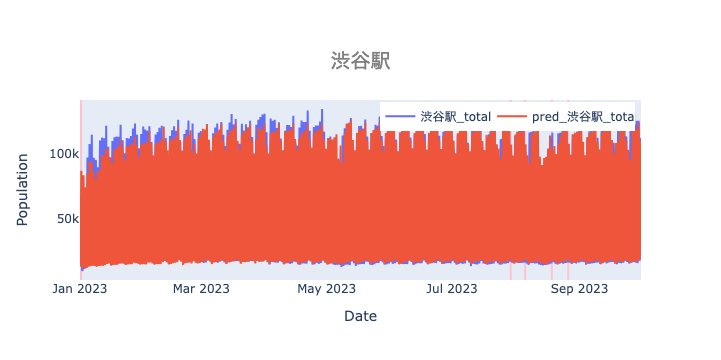

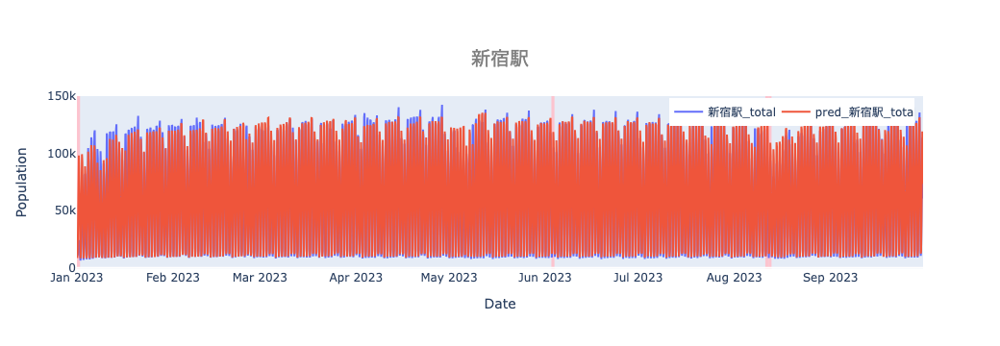

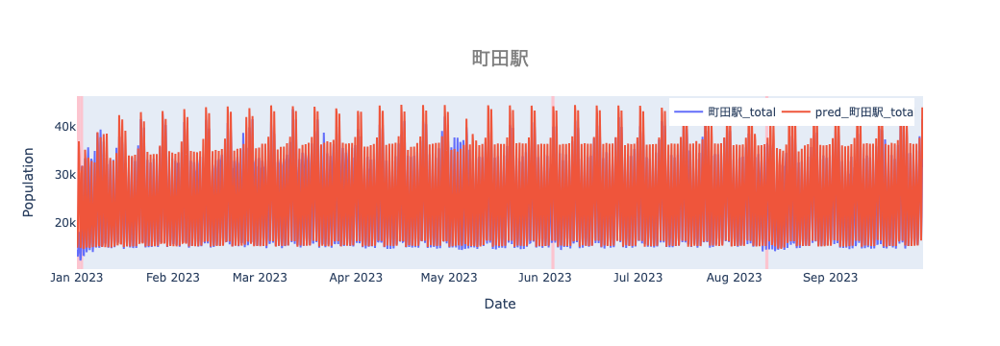

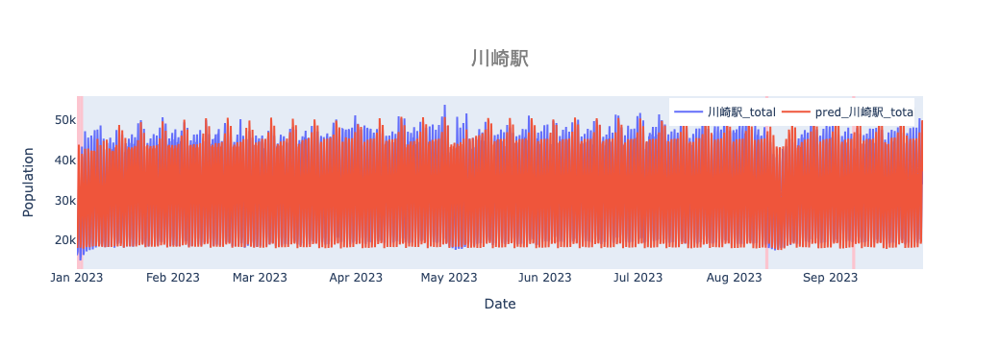

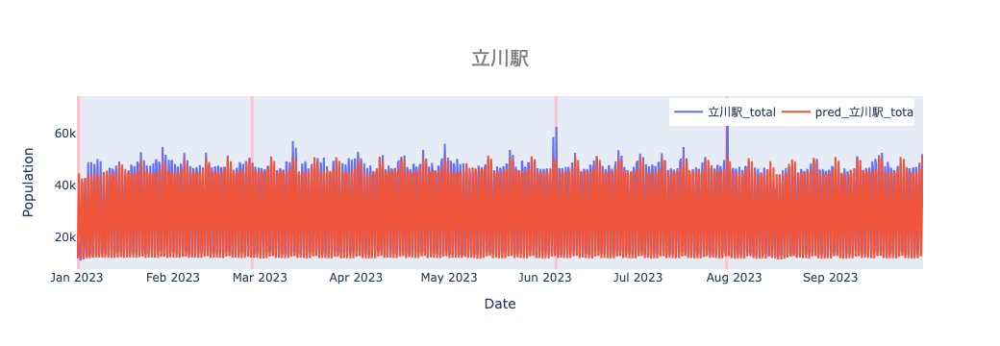

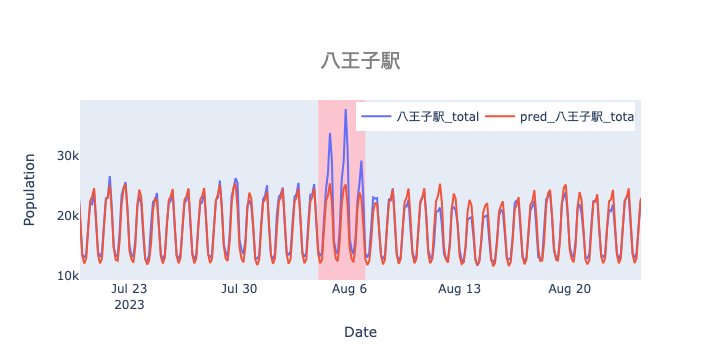

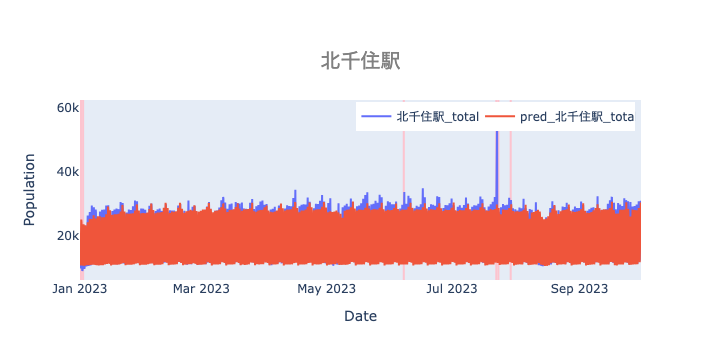

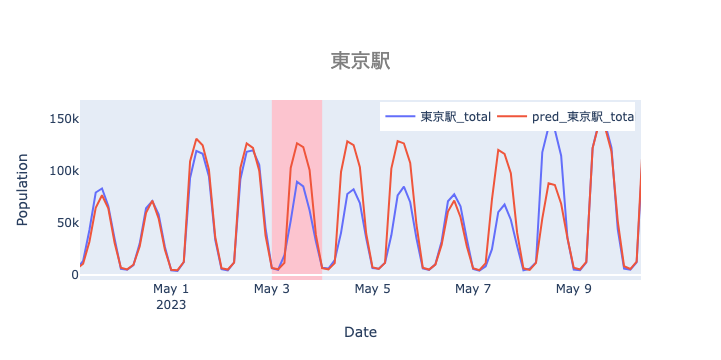

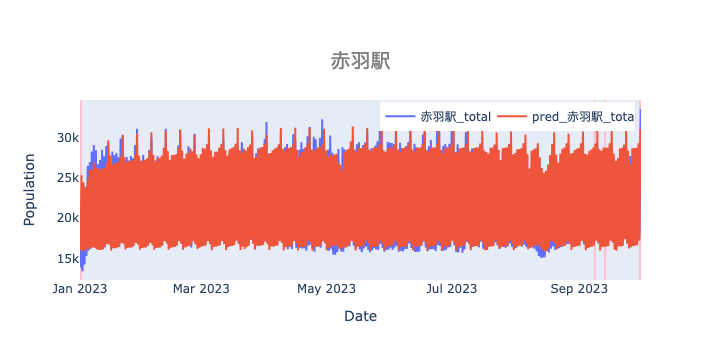

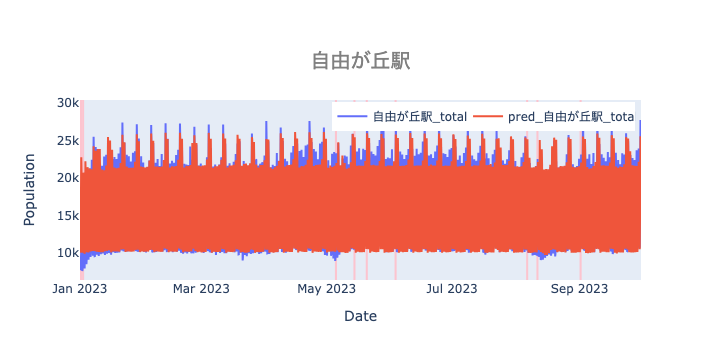

In [ ]:
# make y_true df from a specific date
_df_valid = df_valid.loc['2023-01-01': ,:]
y_true_test = pd.concat([_df_valid, df_test]).iloc[:, :num_features_pred]

# plot
plot_population(y_true_test, y_pred_test, flag='anomaly_detection',
                anomaly_datetime=all_anomaly_date, anomaly_next_hours=all_anomaly_next_date, save=True)

# OTHERS

## Load Past Model

In [ ]:
'''
This code is used only for loading the model and checking its prediction.
'''
# # set name of the model
# model_num = 27
# # load the model and its loss
# model = torch.load('/Users/koki/PycharmProjects/MasterThesis/models/model_' + str(model_num).zfill(2) + '.pth')
# loss = pd.read_excel('/Users/koki/PycharmProjects/MasterThesis/data/results.xlsx', sheet_name='train_losses', usecols=[model_num-1])
# train_losses = loss.iloc[:,0].to_list()

### Combine y_pred and benchmark for more acurate prediction (experiments)

In [ ]:
class NN(nn.Module):
    '''
    train LSTM encoder-decoder and make predictions
    モデル：全変数をLSTMに入力し、二層の線型結合層に通して予測値を出力
    '''

    def __init__(self, num_features, num_features_pred):

        '''
        : param input_size:     the number of expected features in the input X
        : param hidden_size:    the number of features in the hidden state h
        '''

        super(NN, self).__init__()
        # define fc layer
        self.linear = nn.Linear(num_features, 1024)
        # self.linear2 = nn.Linear(256, 1024)
        # self.linear3 = nn.Linear(2048, 512)
        # self.linear4 = nn.Linear(2048, 512)
        self.linear5 = nn.Linear(1024, num_features_pred)
        # define relu
        self.relu = nn.ReLU()
        # define dropout
        self.dropout = nn.Dropout(0.1)

    def forward(self, src):
        '''
        : param src:    input tensor with shape (batch_size, seq_len,  number features); PyTorch tensor
        '''
        output = self.linear(src)
        output = self.relu(output)
        output = self.dropout(output)
        # output = self.linear2(output)
        # output = self.relu(output)
        # output = self.dropout(output)
        # output = self.linear3(output)
        # output = self.relu(output)
        # output = self.dropout(output)
        # output = self.linear4(output)
        # output = self.relu(output)
        # output = self.dropout(output)
        output = self.linear5(output)

        return output

In [ ]:
def train(model, data_loader, num_features_pred):
    total_loss = []
    for src, tgt in data_loader:
        src = src.to(device)
        tgt = tgt.to(device)

        # zero the gradient
        optimizer.zero_grad()

        output = model(src=src)

        # compute the loss
        loss = criterion(output, tgt)

        total_loss.append(loss.cpu().detach())

        # backpropagation
        loss.backward()
        optimizer.step()

    # change learning rate
    scheduler.step()

    # return loss for epoch
    return np.average(total_loss)


def predict(model, data_loader):
    model.eval()
    with torch.no_grad():
        all_outputs = torch.Tensor().to(device)
        for src, tgt in data_loader:
            src = src.to(device)
            tgt = tgt.to(device)

            output = model(src=src)
            all_outputs = torch.cat([all_outputs, output], dim=0)

    return all_outputs.to('cpu').detach().numpy()

In [ ]:
df_bench_true, df_bench_pred = get_benchmark(df_valid)

  0%|          | 0/2920 [00:00<?, ?it/s]

UndefinedVariableError: ignored

In [ ]:
# import data
df = pd.read_csv('/Users/koki/PycharmProjects/MasterThesis/data/preprocessed/201601to202309_10areas_for_analysis.csv')
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.set_index('datetime')

# covid dummy
covid_1 = pd.date_range(start='2020-03-01', end='2020-05-30 21:00', freq='3h')  # 第1波
covid_2 = pd.date_range(start='2020-11-01', end='2021-04-30 21:00', freq='3h')  # 第3波, 第4波
covid_3 = pd.date_range(start='2021-07-01', end='2021-09-30 21:00', freq='3h')  # 第5波
covid_4 = pd.date_range(start='2021-12-01', end='2022-03-31 21:00', freq='3h')  # 第6波(オミクロン株の拡大)
covid = covid_1.union(covid_2).union(covid_3).union(covid_4)
df['covid'] = df.index.map(lambda d: int(d in covid))

In [ ]:
df.columns

In [ ]:
df = df.drop(columns=[
                      'month_1', 'month_10', 'month_11', 'month_12', 'month_2', 'month_3',
                      'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9',
                      'hour_0', 'hour_12', 'hour_15', 'hour_18', 'hour_21', 'hour_3', 'hour_6', 'hour_9',
                      'dow_Fri', 'dow_Mon', 'dow_Sat', 'dow_Sun', 'dow_Thu', 'dow_Tue', 'dow_Wed',
                      'covid',
                      'Cases_Tokyo',
                      'N225_Close',
                    ])

In [ ]:
num_features_pred = yaml_data['training']['num_features_pred']
batch_size = 4

# combine_df = pd.concat([df_bench_pred, df_valid.iloc[:, num_features_pred:]], axis=1)
combine_df = pd.concat([df_bench_pred, df.loc[valid_start:valid_end].iloc[:, num_features_pred:]], axis=1)

# from sklearn.preprocessing import StandardScaler, MinMaxScaler
# foo = StandardScaler()
# # foo = MinMaxScaler()
# foo.fit(combine_df)
# combine_df_ss = foo.transform(combine_df)

combine_dataset = TensorDataset(torch.FloatTensor(combine_df.values), torch.FloatTensor(df_bench_true.values))
combine_loader = DataLoader(combine_dataset, batch_size=batch_size, shuffle=True, drop_last=False, num_workers=0, pin_memory=True)

In [ ]:
# class MAELoss(nn.Module):
#     def __init__(self):
#         super(MAELoss, self).__init__()

#     def forward(self, outputs, targets):

#         loss = torch.mean(torch.abs(outputs - targets))
#         return loss

In [ ]:
num_features = df.shape[1]
n_epochs = 20

model = NN(num_features = num_features, num_features_pred=num_features_pred).to(device)

optimizer = optim.Adam(model.parameters(), lr = 0.00004)
scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[15], gamma=0.8)
criterion = nn.MSELoss().to(device)

In [ ]:
start = time.time()
train_losses = []
with trange(n_epochs) as tr:
    for it in tr:
        # train
        loss_train = train(model=model, data_loader=combine_loader, num_features_pred=num_features_pred)
        # convert to RMSE
        loss_train = math.sqrt(loss_train)
        # append epoch loss
        train_losses.append(loss_train)
        # progress bar
        tr.set_postfix(Train_loss="{0:.3f}".format(loss_train))

# calculate execution time
end = time.time()
t = math.floor(end-start)
elapsed_hour = t // 3600
elapsed_minute = (t % 3600) // 60
elapsed_second = (t % 3600 % 60)
elapsed_time = str(elapsed_hour).zfill(2) + ":" + str(elapsed_minute).zfill(2) + ":" + str(elapsed_second).zfill(2)

In [ ]:
plt.plot(train_losses, label='Train Loss')
plt.title('Train Losses (RMSE)')
plt.legend()
plt.show()

In [ ]:
# make y_pred df
combine_loader = DataLoader(combine_dataset, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=0, pin_memory=True)
pred_val = predict(model = model, data_loader = combine_loader)
y_pred_val = pd.DataFrame(pred_val, columns=df.columns[:num_features_pred], index=df_valid.index).add_prefix('pred_')

In [ ]:
rmse_pre_actu, mae_pre_actu = calc_rmse_mae(df_valid, y_pred_val)

In [ ]:
# make y_true df from a specific date
_df_train = df_train.loc['2021-10-01': ,:]
y_true_val = pd.concat([_df_train, df_valid]).iloc[:, :num_features_pred]
# y_true = df.loc['2021-10-01':valid_end, :].iloc[:, :num_features_pred]

plot_population(y_true_val, y_pred_val, flag='pred_combined', save=True)

In [ ]:
# notification
# !afplay '/Users/koki/Documents/セレナと一緒/result_message.m4a'

In [ ]:
print('Done!')

### Memo

In [ ]:
'''
再帰的に予測する際、t+1期のインプットには、t期の人流のアウトプット（t+1期の人流の予測値）＋t+1期の実際のダミー情報（t期からアウトプットされた予測ではなく本当のデータ）を利用する。
    →例えば曜日などは予測しなくてもわかるはずなので、わざわざ再帰的に予測値をインプットする必要がない

学習には3時間おきのデータを利用。昼間だけを使うのは予測の時だけ。
'''

'\n再帰的に予測する際、t+1期のインプットには、t期の人流のアウトプット（t+1期の人流の予測値）＋t+1期の実際のダミー情報（t期からアウトプットされた予測ではなく本当のデータ）を利用する。\n    →例えば曜日などは予測しなくてもわかるはずなので、わざわざ再帰的に予測値をインプットする必要がない\n    \n学習には3時間おきのデータを利用。昼間だけを使うのは予測の時だけ。    \n'

### Questions

In [ ]:
'''
seq2seqの推論時、decoderは前期の出力を入力して、再起的にループさせる。それは学習時も同じ？
 - no

単純なlstmは、出力が一期先のみ。targetが複数期先にして学習する時は、学習時もループさせるの？
もしそうなら、targetも複数期ある意味は？それってseq_len_src=8, seq_len_tgt=1のデータセットで学習するのと同じじゃない？
 - no

ベンチマークは、機械学習を使わなかったらどういう予測になるかを見るため？もしそうならベンチマークと比べるのは実測値？
 - yes.

バグの原因は、ミニバッチでpredictしていたからだった。ミニバッチにして一気に予測しようとしていたけど、一気にencoderに入れるとencoderの出力が変わっちゃう？
 - 何でだろうね

閾値の決め方は？
 - validatonでも異常検知を行なって、大きい順にした時の上位1%の異常スコアを閾値にする。

モデルについて
 - lstｍには全変数を入力する。線型結合層は2層以上にしても良い。でもその時はreluに通して非線形にする。

東京全体で異常検知した日を各地点ごとのグラフで表すのは正しいのか？
 -

各地点それぞれで異常検知を行う場合は？

コロナの期間無くす？
普通に回帰してみる
xもyも標準化してみる。予測する際はそれを戻す
ベンチマークも再起的に予測?
 - lstmは再起的に予測しているのに、ベンチマークは再起的に予測していないのでちょっとずるい？
直近のデータとそのダミーを使って回帰して、仮予測値を作成
その仮予測値に予測日のダミーを加えて、さらに回帰
曜日ダミーや月ダミーなどを分けて推定？
回帰の際は、時間トレンドや季節性をちょっと入れる



'''

'\nseq2seqの推論時、decoderは前期の出力を入力して、再起的にループさせる。それは学習時も同じ？\n - no\n \n単純なlstmは、出力が一期先のみ。targetが複数期先にして学習する時は、学習時もループさせるの？\nもしそうなら、targetも複数期ある意味は？それってseq_len_src=8, seq_len_tgt=1のデータセットで学習するのと同じじゃない？\n - no\n\nベンチマークは、機械学習を使わなかったらどういう予測になるかを見るため？もしそうならベンチマークと比べるのは実測値？\n - yes.\n\nバグの原因は、ミニバッチでpredictしていたからだった。ミニバッチにして一気に予測しようとしていたけど、一気にencoderに入れるとencoderの出力が変わっちゃう？\n - 何でだろうね\n\n閾値の決め方は？\n - validatonでも異常検知を行なって、大きい順にした時の上位1%の異常スコアを閾値にする。\n \nモデルについて\n - lstｍには全変数を入力する。線型結合層は2層以上にしても良い。でもその時はreluに通して非線形にする。\n\n東京全体で異常検知した日を各地点ごとのグラフで表すのは正しいのか？\n -  \n\n\n'

### Insight

In [ ]:
'''
バッチサイズは16くらいが良い。それ以上だとロスがすごく大きい値で収束する。

'''

'\nバッチサイズは16くらいが良い。それ以上だとロスがすごく大きい値で収束する。\n\n'

### To Do

In [ ]:
'''
時間ダミーと月ダミーを抜く
encoderは2日にする
差を計算する
時間を多次元とみて計算
'''

'\n'